#Imports

In [1]:
!pip install -q pytorch-lightning

In [2]:
import numpy as np
import matplotlib.pyplot as plt
import random
import torch
import torch.nn as nn
from torch.optim import Adam
from torchmetrics import Accuracy
from torchvision import transforms
from torch.utils.data import TensorDataset, DataLoader, random_split
from pytorch_lightning.callbacks import ModelCheckpoint, StochasticWeightAveraging
from pytorch_lightning.callbacks.early_stopping import EarlyStopping
import pytorch_lightning as pl

%load_ext autoreload
%autoreload 2

In [3]:
from google.colab import drive
drive.mount('/content/drive')
%cd drive/Shareddrives/C147\ Project

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).
/content/drive/Shareddrives/C147 Project


# Data Augmentations & Dataloaders

In [137]:
def seed_worker(worker_id):
  worker_seed = torch.initial_seed() % 2**32
  np.random.seed(worker_seed)
  random.seed(worker_seed)

def prepare_dataset(g, classIX=None, subjectIX=None):
  X_test = np.load("project/X_test.npy")
  y_test = np.load("project/y_test.npy")
  person_test = np.load("project/person_test.npy")
  person_train_valid = np.load("project/person_train_valid.npy")
  X_train_valid = np.load("project/X_train_valid.npy")
  y_train_valid = np.load("project/y_train_valid.npy")

  if not classIX is None:
    train_ind = np.where(y_train_valid-769==classIX)[0]
    X_train_valid = X_train_valid[train_ind]
    y_train_valid = y_train_valid[train_ind]
    person_train_valid = person_train_valid[train_ind]

    test_ind = np.where(y_test-769==classIX)[0]
    X_test = X_test[test_ind]
    y_test = y_test[test_ind]
    person_test = person_test[test_ind]
  if not subjectIX is None:
    train_ind = np.where(person_train_valid==subjectIX)[0]
    X_train_valid = X_train_valid[train_ind]
    y_train_valid = y_train_valid[train_ind]
    person_train_valid = person_train_valid[train_ind]

    test_ind = np.where(person_test==subjectIX)[0]
    X_test = X_test[test_ind]
    y_test = y_test[test_ind]
    person_test = person_test[test_ind]

  train_size = y_train_valid.shape[0]
  test_size = y_test.shape[0]

  y_train_onehot = np.zeros((train_size, 4))
  for IX in range(len(y_train_valid)):
    class_IX = int(y_train_valid[IX] - 769)
    y_train_onehot[IX, class_IX] = 1

  y_test_onehot = np.zeros((test_size, 4))
  for IX in range(len(y_test)):
    class_IX = int(y_test[IX] - 769)
    y_test_onehot[IX, class_IX] = 1

  person_train_onehot = np.zeros((train_size, 9))
  for IX in range(len(person_train_valid)):
    class_IX = int(person_train_valid[IX])
    person_train_onehot[IX, class_IX] = 1

  person_test_onehot = np.zeros((test_size, 9))
  for IX in range(len(person_test)):
    class_IX = int(person_test[IX])
    person_test_onehot[IX, class_IX] = 1

  X_test_tensor = torch.Tensor(X_test)
  y_test_tensor = torch.Tensor(y_test_onehot)
  person_test_tensor = torch.Tensor(person_test_onehot)
  person_train_valid_tensor = torch.Tensor(person_train_onehot)
  X_train_valid_tensor = torch.Tensor(X_train_valid)
  y_train_valid_tensor = torch.Tensor(y_train_onehot)

  full_train_dataset = TensorDataset(X_train_valid_tensor, y_train_valid_tensor, person_train_valid_tensor)
  test_dataset = TensorDataset(X_test_tensor, y_test_tensor, person_test_tensor)
  trials = X_train_valid.shape[0]
  train_dataset, validation_dataset = random_split(full_train_dataset, [0.8,0.2])

  train_dataloader = DataLoader(train_dataset, batch_size=int(0.8*trials), num_workers=2, pin_memory=True, worker_init_fn=seed_worker, generator=g)
  validation_dataloader = DataLoader(validation_dataset, batch_size=int(0.2*trials), num_workers=2, pin_memory=True, worker_init_fn=seed_worker, generator=g)
  test_dataloader = DataLoader(test_dataset, worker_init_fn=seed_worker, generator=g)

  return train_dataloader, validation_dataloader, test_dataloader

In [138]:
def augment(X, y, subject, subsample_size, average_size):
  X_total = None
  y_total = None
  subject_total = None
  # Maxpool
  X_max = np.max(X.reshape(X.shape[0], X.shape[1], -1, subsample_size), axis=3)
  X_total = X_max
  y_total = y
  subject_total = subject
  # Average
  X_average = np.mean(X.reshape(X.shape[0], X.shape[1], -1, average_size), axis=3)
  X_average += np.random.normal(0, 0.5, X_average.shape)
  X_total = np.vstack((X_total, X_average))
  y_total = np.vstack((y_total, y))
  subject_total = np.vstack((subject_total, subject))
  # Minpool
  X_min = np.min(X.reshape(X.shape[0], X.shape[1], -1, average_size), axis=3)
  X_average += np.random.normal(0, 0.25, X_average.shape)
  X_total = np.vstack((X_total, X_min))
  y_total = np.vstack((y_total, y))
  subject_total = np.vstack((subject_total, subject))
  # 1.2 Scale
  X_min = 1.2 * np.max(X.reshape(X.shape[0], X.shape[1], -1, average_size), axis=3)
  X_total = np.vstack((X_total, X_min))
  y_total = np.vstack((y_total, y))
  subject_total = np.vstack((subject_total, subject))
  # 0.8 Scale
  X_min = 0.8 * np.max(X.reshape(X.shape[0], X.shape[1], -1, average_size), axis=3)
  X_total = np.vstack((X_total, X_min))
  y_total = np.vstack((y_total, y))
  subject_total = np.vstack((subject_total, subject))
  # Subsampling
  for i in range(subsample_size):
    X_subsample = X[:,:,i::subsample_size] + np.random.normal(0, 0.5, X[:,:,i::subsample_size].shape)
    X_total = np.vstack((X_total, X_subsample))
    y_total = np.vstack((y_total, y))
    subject_total = np.vstack((subject_total, subject))
  return X_total, y_total, subject_total

def prepare_dataset_augment(g, classIX=None, subjectIX=None, val_perc=0.05, time_window=512):
  X_test = np.load("project/X_test.npy")
  y_test = np.load("project/y_test.npy")
  person_test = np.load("project/person_test.npy")
  person_train_valid = np.load("project/person_train_valid.npy")
  X_train_valid = np.load("project/X_train_valid.npy")
  y_train_valid = np.load("project/y_train_valid.npy")

  ind_valid = np.random.choice(2115, int(2115*val_perc), replace=False)
  ind_train = np.array(list(set(range(2115)).difference(set(ind_valid))))
  X_train = X_train_valid[ind_train]
  X_valid = X_train_valid[ind_valid]
  y_train = y_train_valid[ind_train]
  y_valid = y_train_valid[ind_valid]
  person_train = person_train_valid[ind_train]
  person_valid = person_train_valid[ind_valid]
    
  if not classIX is None:
    train_ind = np.where(y_valid-769==classIX)[0]
    valid_ind = np.where(y_valid-769==classIX)[0]
    test_ind = np.where(y_test-769==classIX)[0]
    
    X_test = X_test[test_ind]
    y_test = y_test[test_ind]
    person_test = person_test[test_ind]
    
    person_valid = person_valid[valid_ind]
    X_valid = X_valid[valid_ind]
    y_valid = y_valid[valid_ind]
    
    person_train = person_train[train_ind]
    X_train = X_train[train_ind]
    y_train = y_train[train_ind]
  if not subjectIX is None:
    train_ind = np.where(person_train==subjectIX)[0]
    X_train = X_train[train_ind]
    y_train = y_train[train_ind]
    person_train = person_train[train_ind]

    valid_ind = np.where(person_valid==subjectIX)[0]
    person_valid = person_valid[valid_ind]
    X_valid = X_valid[valid_ind]
    y_valid = y_valid[valid_ind]

    test_ind = np.where(person_test==subjectIX)[0]
    X_test = X_test[test_ind]
    y_test = y_test[test_ind]
    person_test = person_test[test_ind]

  train_b = y_train.shape[0]
  valid_b = y_valid.shape[0]
  test_b = y_test.shape[0]

  train_b = y_train.shape[0]
  y_train_onehot = np.zeros((train_b, 4))
  for IX in range(len(y_train)):
    class_IX = int(y_train[IX] - 769)
    y_train_onehot[IX, class_IX] = 1

  test_b = y_test.shape[0]
  y_test_onehot = np.zeros((test_b, 4))
  for IX in range(len(y_test)):
    class_IX = int(y_test[IX] - 769)
    y_test_onehot[IX, class_IX] = 1
    
  valid_b = y_valid.shape[0]
  y_valid_onehot = np.zeros((valid_b, 4))
  for IX in range(len(y_valid)):
    class_IX = int(y_valid[IX] - 769)
    y_valid_onehot[IX, class_IX] = 1

  person_train_onehot = np.zeros((train_b, 9))
  for IX in range(len(person_train)):
    class_IX = int(person_train[IX])
    person_train_onehot[IX, class_IX] = 1

  person_test_onehot = np.zeros((test_b, 9))
  for IX in range(len(person_test)):
    class_IX = int(person_test[IX])
    person_test_onehot[IX, class_IX] = 1
    
  person_valid_onehot = np.zeros((valid_b, 9))
  for IX in range(len(person_valid)):
    class_IX = int(person_valid[IX])
    person_valid_onehot[IX, class_IX] = 1

  # Augmentations
  X_train = X_train[:,:,0:time_window]
  X_valid = X_valid[:,:,0:time_window]
  X_test = X_test[:,:,0:time_window]
  X_train, y_train_onehot, person_train_onehot = augment(X_train, y_train_onehot, person_train_onehot, 2, 2)
  X_test, y_test_onehot, person_test_onehot = augment(X_test, y_test_onehot, person_test_onehot, 2, 2)
  X_valid, y_valid_onehot, person_valid_onehot = augment(X_valid, y_valid_onehot, person_valid_onehot, 2, 2)

  X_test_tensor = torch.Tensor(X_test)
  y_test_tensor = torch.Tensor(y_test_onehot)
  person_test_tensor = torch.Tensor(person_test_onehot)
  person_valid_tensor = torch.Tensor(person_valid_onehot)
  X_valid_tensor = torch.Tensor(X_valid)
  y_valid_tensor = torch.Tensor(y_valid_onehot)
  person_train_tensor = torch.Tensor(person_train_onehot)
  X_train_tensor = torch.Tensor(X_train)
  y_train_tensor = torch.Tensor(y_train_onehot)

  train_dataset = TensorDataset(X_train_tensor, y_train_tensor, person_train_tensor)
  valid_dataset = TensorDataset(X_valid_tensor, y_valid_tensor, person_valid_tensor)
  test_dataset = TensorDataset(X_test_tensor, y_test_tensor, person_test_tensor)
  train_trials = X_train.shape[0]
  valid_trials = X_valid.shape[0]

  train_dataloader = DataLoader(train_dataset, batch_size=int(train_trials*0.25), pin_memory=True, worker_init_fn=seed_worker, generator=g)
  valid_dataloader = DataLoader(valid_dataset, batch_size=valid_trials, pin_memory=True, worker_init_fn=seed_worker, generator=g)
  test_dataloader = DataLoader(test_dataset, batch_size=valid_trials, worker_init_fn=seed_worker, generator=g)

  return train_dataloader, valid_dataloader, test_dataloader

#TRAIN With No Augmentations!

In [6]:
torch.use_deterministic_algorithms(True, warn_only=True)

checkpoint_callback = ModelCheckpoint(
    save_top_k=3,
    monitor="val_loss",
    mode="min",
    dirpath=None,
    filename="best_val-{epoch:02d}-{val_loss:.2f}",
)

def train_no_aug(model_name, model, seed):
  pl.seed_everything(seed, workers=True)
  g = torch.Generator()
  g.manual_seed(seed)
  train_dataloader, validation_dataloader, test_dataloader = prepare_dataset(g)
  logger = pl.loggers.TensorBoardLogger('official_logs', name=model_name)
  early_stopping_callback = EarlyStopping(monitor='val_loss', mode='min', patience=10)
  trainer = pl.Trainer(max_epochs=360, logger=logger, 
                       callbacks=[early_stopping_callback, checkpoint_callback],
                       accelerator="gpu", devices=1, deterministic=True, 
                       gradient_clip_val=0.5, accumulate_grad_batches=4) 
  trainer.fit(model, train_dataloaders=train_dataloader, val_dataloaders=validation_dataloader)
  return g, trainer, model, test_dataloader

In [7]:
from models.CNN import *
model_name = "CNN no aug"
learning_rate = 1e-3
model = CNN_no_aug(lr=learning_rate)
g, trainer, model, test_dataloader = train_no_aug(model_name, model, 40)

INFO:lightning_fabric.utilities.seed:Global seed set to 40
INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.utilities.rank_zero:IPU available: False, using: 0 IPUs
INFO:pytorch_lightning.utilities.rank_zero:HPU available: False, using: 0 HPUs
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
/usr/local/lib/python3.9/dist-packages/pytorch_lightning/core/optimizer.py:251: RuntimeWarning: Found unsupported keys in the lr scheduler dict: {'optimizer'}. HINT: remove them from the output of `configure_optimizers`.
  rank_zero_warn(
INFO:pytorch_lightning.callbacks.model_summary:
   | Name     | Type               | Params
-------------------------------------------------
0  | accuracy | MulticlassAccuracy | 0     
1  | conv1    | Conv1d             | 5.5 K 
2  | swish1   | Hardswish          | 0     
3  | maxpool1 | MaxPo

Sanity Checking: 0it [00:00, ?it/s]

/usr/local/lib/python3.9/dist-packages/torch/nn/modules/conv.py:309: UserWarning: Using padding='same' with even kernel lengths and odd dilation may require a zero-padded copy of the input be created (Triggered internally at ../aten/src/ATen/native/Convolution.cpp:895.)
  return F.conv1d(input, weight, bias, self.stride,
/usr/local/lib/python3.9/dist-packages/pytorch_lightning/loops/fit_loop.py:280: PossibleUserWarning: The number of training batches (1) is smaller than the logging interval Trainer(log_every_n_steps=50). Set a lower value for log_every_n_steps if you want to see logs for the training epoch.
  rank_zero_warn(


Training: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Epoch 00064: reducing learning rate of group 0 to 1.0000e-04.


Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Epoch 00076: reducing learning rate of group 0 to 1.0000e-05.


Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

In [8]:
overall = trainer.test(model, dataloaders=test_dataloader, ckpt_path="best", verbose=True)

INFO:pytorch_lightning.utilities.rank_zero:Restoring states from the checkpoint path at official_logs/CNN no aug/version_0/checkpoints/best_val-epoch=69-val_loss=1.02.ckpt
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
INFO:pytorch_lightning.utilities.rank_zero:Loaded model weights from the checkpoint at official_logs/CNN no aug/version_0/checkpoints/best_val-epoch=69-val_loss=1.02.ckpt


Testing: 0it [00:00, ?it/s]

────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────
       Test metric             DataLoader 0
────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────
      test_accuracy         0.5417607426643372
        test_loss           1.1081178188323975
────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────


In [9]:
test_acc = []
for subjectIX in range(0,9):
  _, _, test_dataloader_IX = prepare_dataset(g, subjectIX=subjectIX)
  tested = trainer.test(model, dataloaders=test_dataloader_IX, ckpt_path="best", verbose=False)
  tested = tested[0]['test_accuracy']
  test_acc.append(tested)
  print("Subject " + str(subjectIX) + " Test Accuracy: " + str(tested))
  print()

INFO:pytorch_lightning.utilities.rank_zero:Restoring states from the checkpoint path at official_logs/CNN no aug/version_0/checkpoints/best_val-epoch=69-val_loss=1.02.ckpt
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
INFO:pytorch_lightning.utilities.rank_zero:Loaded model weights from the checkpoint at official_logs/CNN no aug/version_0/checkpoints/best_val-epoch=69-val_loss=1.02.ckpt


Testing: 0it [00:00, ?it/s]

Subject 0 Test Accuracy: 0.46000000834465027



INFO:pytorch_lightning.utilities.rank_zero:Restoring states from the checkpoint path at official_logs/CNN no aug/version_0/checkpoints/best_val-epoch=69-val_loss=1.02.ckpt
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
INFO:pytorch_lightning.utilities.rank_zero:Loaded model weights from the checkpoint at official_logs/CNN no aug/version_0/checkpoints/best_val-epoch=69-val_loss=1.02.ckpt


Testing: 0it [00:00, ?it/s]

Subject 1 Test Accuracy: 0.41999998688697815



INFO:pytorch_lightning.utilities.rank_zero:Restoring states from the checkpoint path at official_logs/CNN no aug/version_0/checkpoints/best_val-epoch=69-val_loss=1.02.ckpt
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
INFO:pytorch_lightning.utilities.rank_zero:Loaded model weights from the checkpoint at official_logs/CNN no aug/version_0/checkpoints/best_val-epoch=69-val_loss=1.02.ckpt


Testing: 0it [00:00, ?it/s]

Subject 2 Test Accuracy: 0.5199999809265137



INFO:pytorch_lightning.utilities.rank_zero:Restoring states from the checkpoint path at official_logs/CNN no aug/version_0/checkpoints/best_val-epoch=69-val_loss=1.02.ckpt
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
INFO:pytorch_lightning.utilities.rank_zero:Loaded model weights from the checkpoint at official_logs/CNN no aug/version_0/checkpoints/best_val-epoch=69-val_loss=1.02.ckpt


Testing: 0it [00:00, ?it/s]

Subject 3 Test Accuracy: 0.6399999856948853



INFO:pytorch_lightning.utilities.rank_zero:Restoring states from the checkpoint path at official_logs/CNN no aug/version_0/checkpoints/best_val-epoch=69-val_loss=1.02.ckpt
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
INFO:pytorch_lightning.utilities.rank_zero:Loaded model weights from the checkpoint at official_logs/CNN no aug/version_0/checkpoints/best_val-epoch=69-val_loss=1.02.ckpt


Testing: 0it [00:00, ?it/s]

Subject 4 Test Accuracy: 0.6170212626457214



INFO:pytorch_lightning.utilities.rank_zero:Restoring states from the checkpoint path at official_logs/CNN no aug/version_0/checkpoints/best_val-epoch=69-val_loss=1.02.ckpt
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
INFO:pytorch_lightning.utilities.rank_zero:Loaded model weights from the checkpoint at official_logs/CNN no aug/version_0/checkpoints/best_val-epoch=69-val_loss=1.02.ckpt


Testing: 0it [00:00, ?it/s]

Subject 5 Test Accuracy: 0.5510203838348389



INFO:pytorch_lightning.utilities.rank_zero:Restoring states from the checkpoint path at official_logs/CNN no aug/version_0/checkpoints/best_val-epoch=69-val_loss=1.02.ckpt
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
INFO:pytorch_lightning.utilities.rank_zero:Loaded model weights from the checkpoint at official_logs/CNN no aug/version_0/checkpoints/best_val-epoch=69-val_loss=1.02.ckpt


Testing: 0it [00:00, ?it/s]

Subject 6 Test Accuracy: 0.6399999856948853



INFO:pytorch_lightning.utilities.rank_zero:Restoring states from the checkpoint path at official_logs/CNN no aug/version_0/checkpoints/best_val-epoch=69-val_loss=1.02.ckpt
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
INFO:pytorch_lightning.utilities.rank_zero:Loaded model weights from the checkpoint at official_logs/CNN no aug/version_0/checkpoints/best_val-epoch=69-val_loss=1.02.ckpt


Testing: 0it [00:00, ?it/s]

Subject 7 Test Accuracy: 0.47999998927116394



INFO:pytorch_lightning.utilities.rank_zero:Restoring states from the checkpoint path at official_logs/CNN no aug/version_0/checkpoints/best_val-epoch=69-val_loss=1.02.ckpt
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
INFO:pytorch_lightning.utilities.rank_zero:Loaded model weights from the checkpoint at official_logs/CNN no aug/version_0/checkpoints/best_val-epoch=69-val_loss=1.02.ckpt


Testing: 0it [00:00, ?it/s]

Subject 8 Test Accuracy: 0.5531914830207825



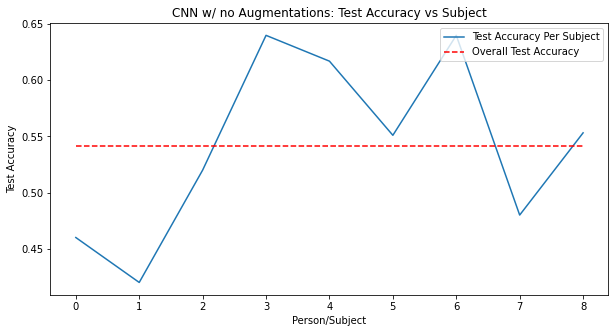

In [10]:
fig = plt.figure(figsize=(10,5))
plt.plot(np.arange(0,9), test_acc, label="Test Accuracy Per Subject")
plt.plot(np.arange(0,9), np.repeat(overall[0]['test_accuracy'], 9), 'r--', label="Overall Test Accuracy")
plt.legend(loc="upper right")
plt.xlabel("Person/Subject")
plt.ylabel("Test Accuracy")
plt.title("CNN w/ no Augmentations: Test Accuracy vs Subject")
plt.show()

#TRAIN With Augmentations (All subjects; Exp 2)!

In [142]:
torch.use_deterministic_algorithms(True, warn_only=True)

checkpoint_callback = ModelCheckpoint(
    save_top_k=3,
    monitor="val_loss",
    mode="min",
    dirpath=None,
    filename="best_val-{epoch:02d}-{val_loss:.2f}")

def train_aug(model_name, model, seed):
  pl.seed_everything(seed, workers=True)
  g = torch.Generator()
  g.manual_seed(seed)
  train_dataloader, validation_dataloader, test_dataloader = prepare_dataset_augment(g)
  early_stopping_callback = EarlyStopping(monitor='val_loss', mode='min', patience=10)
  logger = pl.loggers.TensorBoardLogger('official_logs', name=model_name)
  trainer = pl.Trainer(max_epochs=500, logger=logger, 
                       callbacks= [early_stopping_callback, checkpoint_callback, StochasticWeightAveraging(swa_lrs=7e-4, swa_epoch_start=60)],
                       accelerator="gpu", devices=1, deterministic=True, 
                       gradient_clip_val=2, accumulate_grad_batches=4) 
  trainer.fit(model, train_dataloaders=train_dataloader, val_dataloaders=validation_dataloader)
  return g, trainer, model, test_dataloader

In [143]:
from models.CNN import *
model_name = "CNN w aug"
learning_rate = 1e-3
model = CNN(naive=True, end = False, lr=learning_rate)
g, trainer, model, test_dataloader = train_aug(model_name, model, 40)

INFO:lightning_fabric.utilities.seed:Global seed set to 40
INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.utilities.rank_zero:IPU available: False, using: 0 IPUs
INFO:pytorch_lightning.utilities.rank_zero:HPU available: False, using: 0 HPUs
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
INFO:pytorch_lightning.callbacks.model_summary:
   | Name     | Type               | Params
-------------------------------------------------
0  | accuracy | MulticlassAccuracy | 0     
1  | conv1    | Conv1d             | 5.5 K 
2  | swish1   | ELU                | 0     
3  | maxpool1 | MaxPool1d          | 0     
4  | bn1      | BatchNorm1d        | 50    
5  | dropout1 | Dropout            | 0     
6  | conv2    | Conv1d             | 12.6 K
7  | swish2   | ELU                | 0     
8  | maxpool2 | MaxPool1d          | 0  

Sanity Checking: 0it [00:00, ?it/s]

Training: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

INFO:pytorch_lightning.utilities.rank_zero:Swapping scheduler `ReduceLROnPlateau` for `SWALR`


Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

In [144]:
overall = trainer.test(model, dataloaders=test_dataloader, verbose=True)

INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Testing: 0it [00:00, ?it/s]

────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────
       Test metric             DataLoader 0
────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────
      test_accuracy         0.6952595710754395
        test_loss           0.7892062664031982
────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────


In [145]:
test_acc = []
for subjectIX in range(0,9):
  _, _, test_dataloader_IX = prepare_dataset_augment(g, subjectIX=subjectIX)
  tested = trainer.test(model, dataloaders=test_dataloader_IX, ckpt_path="best", verbose=False)
  tested = tested[0]['test_accuracy']
  test_acc.append(tested)
  print("Subject " + str(subjectIX) + " Test Accuracy: " + str(tested))
  print()

INFO:pytorch_lightning.utilities.rank_zero:Restoring states from the checkpoint path at official_logs/CNN w aug/version_7/checkpoints/best_val-epoch=111-val_loss=0.66.ckpt
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
INFO:pytorch_lightning.utilities.rank_zero:Loaded model weights from the checkpoint at official_logs/CNN w aug/version_7/checkpoints/best_val-epoch=111-val_loss=0.66.ckpt


Testing: 0it [00:00, ?it/s]

Subject 0 Test Accuracy: 0.6228571534156799



INFO:pytorch_lightning.utilities.rank_zero:Restoring states from the checkpoint path at official_logs/CNN w aug/version_7/checkpoints/best_val-epoch=111-val_loss=0.66.ckpt
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
INFO:pytorch_lightning.utilities.rank_zero:Loaded model weights from the checkpoint at official_logs/CNN w aug/version_7/checkpoints/best_val-epoch=111-val_loss=0.66.ckpt


Testing: 0it [00:00, ?it/s]

Subject 1 Test Accuracy: 0.5542857050895691



INFO:pytorch_lightning.utilities.rank_zero:Restoring states from the checkpoint path at official_logs/CNN w aug/version_7/checkpoints/best_val-epoch=111-val_loss=0.66.ckpt
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
INFO:pytorch_lightning.utilities.rank_zero:Loaded model weights from the checkpoint at official_logs/CNN w aug/version_7/checkpoints/best_val-epoch=111-val_loss=0.66.ckpt


Testing: 0it [00:00, ?it/s]

Subject 2 Test Accuracy: 0.7228571176528931



INFO:pytorch_lightning.utilities.rank_zero:Restoring states from the checkpoint path at official_logs/CNN w aug/version_7/checkpoints/best_val-epoch=111-val_loss=0.66.ckpt
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
INFO:pytorch_lightning.utilities.rank_zero:Loaded model weights from the checkpoint at official_logs/CNN w aug/version_7/checkpoints/best_val-epoch=111-val_loss=0.66.ckpt


Testing: 0it [00:00, ?it/s]

Subject 3 Test Accuracy: 0.7114285826683044



INFO:pytorch_lightning.utilities.rank_zero:Restoring states from the checkpoint path at official_logs/CNN w aug/version_7/checkpoints/best_val-epoch=111-val_loss=0.66.ckpt
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
INFO:pytorch_lightning.utilities.rank_zero:Loaded model weights from the checkpoint at official_logs/CNN w aug/version_7/checkpoints/best_val-epoch=111-val_loss=0.66.ckpt


Testing: 0it [00:00, ?it/s]

Subject 4 Test Accuracy: 0.8054711222648621



INFO:pytorch_lightning.utilities.rank_zero:Restoring states from the checkpoint path at official_logs/CNN w aug/version_7/checkpoints/best_val-epoch=111-val_loss=0.66.ckpt
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
INFO:pytorch_lightning.utilities.rank_zero:Loaded model weights from the checkpoint at official_logs/CNN w aug/version_7/checkpoints/best_val-epoch=111-val_loss=0.66.ckpt


Testing: 0it [00:00, ?it/s]

Subject 5 Test Accuracy: 0.6355684995651245



INFO:pytorch_lightning.utilities.rank_zero:Restoring states from the checkpoint path at official_logs/CNN w aug/version_7/checkpoints/best_val-epoch=111-val_loss=0.66.ckpt
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
INFO:pytorch_lightning.utilities.rank_zero:Loaded model weights from the checkpoint at official_logs/CNN w aug/version_7/checkpoints/best_val-epoch=111-val_loss=0.66.ckpt


Testing: 0it [00:00, ?it/s]

Subject 6 Test Accuracy: 0.7428571581840515



INFO:pytorch_lightning.utilities.rank_zero:Restoring states from the checkpoint path at official_logs/CNN w aug/version_7/checkpoints/best_val-epoch=111-val_loss=0.66.ckpt
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
INFO:pytorch_lightning.utilities.rank_zero:Loaded model weights from the checkpoint at official_logs/CNN w aug/version_7/checkpoints/best_val-epoch=111-val_loss=0.66.ckpt


Testing: 0it [00:00, ?it/s]

Subject 7 Test Accuracy: 0.6257143020629883



INFO:pytorch_lightning.utilities.rank_zero:Restoring states from the checkpoint path at official_logs/CNN w aug/version_7/checkpoints/best_val-epoch=111-val_loss=0.66.ckpt
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
INFO:pytorch_lightning.utilities.rank_zero:Loaded model weights from the checkpoint at official_logs/CNN w aug/version_7/checkpoints/best_val-epoch=111-val_loss=0.66.ckpt


Testing: 0it [00:00, ?it/s]

Subject 8 Test Accuracy: 0.7689969539642334



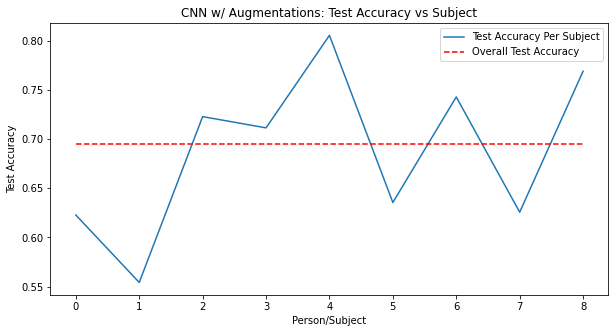

In [146]:
fig = plt.figure(figsize=(10,5))
plt.plot(np.arange(0,9), test_acc, label="Test Accuracy Per Subject")
plt.plot(np.arange(0,9), np.repeat(overall[0]['test_accuracy'], 9), 'r--', label="Overall Test Accuracy")
plt.legend(loc="upper right")
plt.xlabel("Person/Subject")
plt.ylabel("Test Accuracy")
plt.title("CNN w/ Augmentations: Test Accuracy vs Subject")
plt.show()

#TRAIN With Augmentations & MHA (All subjects; Exp 2)!

In [12]:
torch.use_deterministic_algorithms(True, warn_only=True)

checkpoint_callback = ModelCheckpoint(
    save_top_k=3,
    monitor="val_loss",
    mode="min",
    dirpath=None,
    filename="best_val-{epoch:02d}-{val_loss:.2f}")

def train_aug(model_name, model, seed):
  pl.seed_everything(seed, workers=True)
  g = torch.Generator()
  g.manual_seed(seed)
  train_dataloader, validation_dataloader, test_dataloader = prepare_dataset_augment(g)
  logger = pl.loggers.TensorBoardLogger('official_logs', name=model_name)
  early_stopping_callback = EarlyStopping(monitor='val_loss', mode='min', patience=12)
  trainer = pl.Trainer(max_epochs=1000, logger=logger, 
                       callbacks=[early_stopping_callback, checkpoint_callback],
                       accelerator="gpu", devices=1, deterministic=True, 
                       gradient_clip_val=2, accumulate_grad_batches=4) 
  trainer.fit(model, train_dataloaders=train_dataloader, val_dataloaders=validation_dataloader)
  return g, trainer, model, test_dataloader

In [13]:
from models.CNN import *
model_name = "CNN MHA w aug"
learning_rate = 6e-4
model = CNN_MHA(naive=True, end = False, lr=learning_rate)
g, trainer, model, test_dataloader = train_aug(model_name, model, 40)

INFO:lightning_fabric.utilities.seed:Global seed set to 40
INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.utilities.rank_zero:IPU available: False, using: 0 IPUs
INFO:pytorch_lightning.utilities.rank_zero:HPU available: False, using: 0 HPUs
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
INFO:pytorch_lightning.callbacks.model_summary:
   | Name     | Type               | Params
-------------------------------------------------
0  | accuracy | MulticlassAccuracy | 0     
1  | conv1    | Conv1d             | 6.1 K 
2  | swish1   | SiLU               | 0     
3  | maxpool1 | MaxPool1d          | 0     
4  | bn1      | BatchNorm1d        | 50    
5  | dropout1 | Dropout            | 0     
6  | conv2    | Conv1d             | 13.8 K
7  | swish2   | SiLU               | 0     
8  | maxpool2 | MaxPool1d          | 0  

Sanity Checking: 0it [00:00, ?it/s]

Training: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Epoch 00080: reducing learning rate of group 0 to 6.0000e-05.


Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Epoch 00086: reducing learning rate of group 0 to 6.0000e-06.


In [14]:
overall = trainer.test(model, dataloaders=test_dataloader, ckpt_path="best", verbose=True)

INFO:pytorch_lightning.utilities.rank_zero:Restoring states from the checkpoint path at official_logs/CNN MHA w aug/version_0/checkpoints/best_val-epoch=73-val_loss=0.84.ckpt
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
INFO:pytorch_lightning.utilities.rank_zero:Loaded model weights from the checkpoint at official_logs/CNN MHA w aug/version_0/checkpoints/best_val-epoch=73-val_loss=0.84.ckpt


Testing: 0it [00:00, ?it/s]

────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────
       Test metric             DataLoader 0
────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────
      test_accuracy         0.6230248212814331
        test_loss           0.9598848223686218
────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────


In [15]:
test_acc = []
for subjectIX in range(0,9):
  _, _, test_dataloader_IX = prepare_dataset_augment(g, subjectIX=subjectIX)
  tested = trainer.test(model, dataloaders=test_dataloader_IX, ckpt_path="best", verbose=False)
  tested = tested[0]['test_accuracy']
  test_acc.append(tested)
  print("Subject " + str(subjectIX) + " Test Accuracy: " + str(tested))
  print()

INFO:pytorch_lightning.utilities.rank_zero:Restoring states from the checkpoint path at official_logs/CNN MHA w aug/version_0/checkpoints/best_val-epoch=73-val_loss=0.84.ckpt
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
INFO:pytorch_lightning.utilities.rank_zero:Loaded model weights from the checkpoint at official_logs/CNN MHA w aug/version_0/checkpoints/best_val-epoch=73-val_loss=0.84.ckpt


Testing: 0it [00:00, ?it/s]

Subject 0 Test Accuracy: 0.5600000023841858



INFO:pytorch_lightning.utilities.rank_zero:Restoring states from the checkpoint path at official_logs/CNN MHA w aug/version_0/checkpoints/best_val-epoch=73-val_loss=0.84.ckpt
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
INFO:pytorch_lightning.utilities.rank_zero:Loaded model weights from the checkpoint at official_logs/CNN MHA w aug/version_0/checkpoints/best_val-epoch=73-val_loss=0.84.ckpt


Testing: 0it [00:00, ?it/s]

Subject 1 Test Accuracy: 0.49142858386039734



INFO:pytorch_lightning.utilities.rank_zero:Restoring states from the checkpoint path at official_logs/CNN MHA w aug/version_0/checkpoints/best_val-epoch=73-val_loss=0.84.ckpt
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
INFO:pytorch_lightning.utilities.rank_zero:Loaded model weights from the checkpoint at official_logs/CNN MHA w aug/version_0/checkpoints/best_val-epoch=73-val_loss=0.84.ckpt


Testing: 0it [00:00, ?it/s]

Subject 2 Test Accuracy: 0.6342856884002686



INFO:pytorch_lightning.utilities.rank_zero:Restoring states from the checkpoint path at official_logs/CNN MHA w aug/version_0/checkpoints/best_val-epoch=73-val_loss=0.84.ckpt
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
INFO:pytorch_lightning.utilities.rank_zero:Loaded model weights from the checkpoint at official_logs/CNN MHA w aug/version_0/checkpoints/best_val-epoch=73-val_loss=0.84.ckpt


Testing: 0it [00:00, ?it/s]

Subject 3 Test Accuracy: 0.5885714292526245



INFO:pytorch_lightning.utilities.rank_zero:Restoring states from the checkpoint path at official_logs/CNN MHA w aug/version_0/checkpoints/best_val-epoch=73-val_loss=0.84.ckpt
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
INFO:pytorch_lightning.utilities.rank_zero:Loaded model weights from the checkpoint at official_logs/CNN MHA w aug/version_0/checkpoints/best_val-epoch=73-val_loss=0.84.ckpt


Testing: 0it [00:00, ?it/s]

Subject 4 Test Accuracy: 0.7568389177322388



INFO:pytorch_lightning.utilities.rank_zero:Restoring states from the checkpoint path at official_logs/CNN MHA w aug/version_0/checkpoints/best_val-epoch=73-val_loss=0.84.ckpt
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
INFO:pytorch_lightning.utilities.rank_zero:Loaded model weights from the checkpoint at official_logs/CNN MHA w aug/version_0/checkpoints/best_val-epoch=73-val_loss=0.84.ckpt


Testing: 0it [00:00, ?it/s]

Subject 5 Test Accuracy: 0.6647230386734009



INFO:pytorch_lightning.utilities.rank_zero:Restoring states from the checkpoint path at official_logs/CNN MHA w aug/version_0/checkpoints/best_val-epoch=73-val_loss=0.84.ckpt
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
INFO:pytorch_lightning.utilities.rank_zero:Loaded model weights from the checkpoint at official_logs/CNN MHA w aug/version_0/checkpoints/best_val-epoch=73-val_loss=0.84.ckpt


Testing: 0it [00:00, ?it/s]

Subject 6 Test Accuracy: 0.654285728931427



INFO:pytorch_lightning.utilities.rank_zero:Restoring states from the checkpoint path at official_logs/CNN MHA w aug/version_0/checkpoints/best_val-epoch=73-val_loss=0.84.ckpt
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
INFO:pytorch_lightning.utilities.rank_zero:Loaded model weights from the checkpoint at official_logs/CNN MHA w aug/version_0/checkpoints/best_val-epoch=73-val_loss=0.84.ckpt


Testing: 0it [00:00, ?it/s]

Subject 7 Test Accuracy: 0.5942857265472412



INFO:pytorch_lightning.utilities.rank_zero:Restoring states from the checkpoint path at official_logs/CNN MHA w aug/version_0/checkpoints/best_val-epoch=73-val_loss=0.84.ckpt
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
INFO:pytorch_lightning.utilities.rank_zero:Loaded model weights from the checkpoint at official_logs/CNN MHA w aug/version_0/checkpoints/best_val-epoch=73-val_loss=0.84.ckpt


Testing: 0it [00:00, ?it/s]

Subject 8 Test Accuracy: 0.6778115630149841



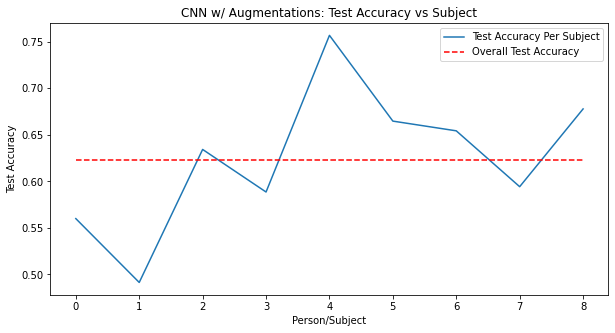

In [16]:
fig = plt.figure(figsize=(10,5))
plt.plot(np.arange(0,9), test_acc, label="Test Accuracy Per Subject")
plt.plot(np.arange(0,9), np.repeat(overall[0]['test_accuracy'], 9), 'r--', label="Overall Test Accuracy")
plt.legend(loc="upper right")
plt.xlabel("Person/Subject")
plt.ylabel("Test Accuracy")
plt.title("CNN w/ Augmentations: Test Accuracy vs Subject")
plt.show()

#TRAIN With Augmentations & LSTM (All subjects; Exp 2)!

In [39]:
torch.use_deterministic_algorithms(True, warn_only=True)

checkpoint_callback = ModelCheckpoint(
    save_top_k=3,
    monitor="val_loss",
    mode="min",
    dirpath=None,
    filename="best_val-{epoch:02d}-{val_loss:.2f}")

def train_aug(model_name, model, seed):
  pl.seed_everything(seed, workers=True)
  g = torch.Generator()
  g.manual_seed(seed)
  train_dataloader, validation_dataloader, test_dataloader = prepare_dataset_augment(g)
  logger = pl.loggers.TensorBoardLogger('official_logs', name=model_name)
  early_stopping_callback = EarlyStopping(monitor='val_loss', mode='min', patience=12)
  trainer = pl.Trainer(max_epochs=1000, logger=logger, 
                       callbacks=[early_stopping_callback, checkpoint_callback],
                       accelerator="gpu", devices=1, deterministic=True, 
                       gradient_clip_val=2, accumulate_grad_batches=4) 
  trainer.fit(model, train_dataloaders=train_dataloader, val_dataloaders=validation_dataloader)
  return g, trainer, model, test_dataloader

In [40]:
from models.CNN import *
model_name = "CNN LSTM w aug"
learning_rate = 6e-4
model = CNN_LSTM(naive=True, end = False, lr=learning_rate)
g, trainer, model, test_dataloader = train_aug(model_name, model, 40)

INFO:lightning_fabric.utilities.seed:Global seed set to 40
INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.utilities.rank_zero:IPU available: False, using: 0 IPUs
INFO:pytorch_lightning.utilities.rank_zero:HPU available: False, using: 0 HPUs
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
/usr/local/lib/python3.9/dist-packages/pytorch_lightning/core/optimizer.py:251: RuntimeWarning: Found unsupported keys in the lr scheduler dict: {'optimizer'}. HINT: remove them from the output of `configure_optimizers`.
  rank_zero_warn(
INFO:pytorch_lightning.callbacks.model_summary:
   | Name     | Type               | Params
-------------------------------------------------
0  | accuracy | MulticlassAccuracy | 0     
1  | conv1    | Conv1d             | 6.1 K 
2  | swish1   | SiLU               | 0     
3  | maxpool1 | MaxPo

Sanity Checking: 0it [00:00, ?it/s]

/usr/local/lib/python3.9/dist-packages/pytorch_lightning/loops/fit_loop.py:280: PossibleUserWarning: The number of training batches (5) is smaller than the logging interval Trainer(log_every_n_steps=50). Set a lower value for log_every_n_steps if you want to see logs for the training epoch.
  rank_zero_warn(


Training: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Epoch 00046: reducing learning rate of group 0 to 6.0000e-05.


Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Epoch 00052: reducing learning rate of group 0 to 6.0000e-06.


In [41]:
overall = trainer.test(model, dataloaders=test_dataloader, ckpt_path="best", verbose=True)

INFO:pytorch_lightning.utilities.rank_zero:Restoring states from the checkpoint path at official_logs/CNN LSTM w aug/version_0/checkpoints/best_val-epoch=39-val_loss=0.95.ckpt
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
INFO:pytorch_lightning.utilities.rank_zero:Loaded model weights from the checkpoint at official_logs/CNN LSTM w aug/version_0/checkpoints/best_val-epoch=39-val_loss=0.95.ckpt


Testing: 0it [00:00, ?it/s]

────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────
       Test metric             DataLoader 0
────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────
      test_accuracy         0.5556272268295288
        test_loss            1.071966528892517
────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────


In [42]:
test_acc = []
for subjectIX in range(0,9):
  _, _, test_dataloader_IX = prepare_dataset_augment(g, subjectIX=subjectIX)
  tested = trainer.test(model, dataloaders=test_dataloader_IX, ckpt_path="best", verbose=False)
  tested = tested[0]['test_accuracy']
  test_acc.append(tested)
  print("Subject " + str(subjectIX) + " Test Accuracy: " + str(tested))
  print()

INFO:pytorch_lightning.utilities.rank_zero:Restoring states from the checkpoint path at official_logs/CNN LSTM w aug/version_0/checkpoints/best_val-epoch=39-val_loss=0.95.ckpt
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
INFO:pytorch_lightning.utilities.rank_zero:Loaded model weights from the checkpoint at official_logs/CNN LSTM w aug/version_0/checkpoints/best_val-epoch=39-val_loss=0.95.ckpt


Testing: 0it [00:00, ?it/s]

Subject 0 Test Accuracy: 0.41999998688697815



INFO:pytorch_lightning.utilities.rank_zero:Restoring states from the checkpoint path at official_logs/CNN LSTM w aug/version_0/checkpoints/best_val-epoch=39-val_loss=0.95.ckpt
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
INFO:pytorch_lightning.utilities.rank_zero:Loaded model weights from the checkpoint at official_logs/CNN LSTM w aug/version_0/checkpoints/best_val-epoch=39-val_loss=0.95.ckpt


Testing: 0it [00:00, ?it/s]

Subject 1 Test Accuracy: 0.4028571546077728



INFO:pytorch_lightning.utilities.rank_zero:Restoring states from the checkpoint path at official_logs/CNN LSTM w aug/version_0/checkpoints/best_val-epoch=39-val_loss=0.95.ckpt
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
INFO:pytorch_lightning.utilities.rank_zero:Loaded model weights from the checkpoint at official_logs/CNN LSTM w aug/version_0/checkpoints/best_val-epoch=39-val_loss=0.95.ckpt


Testing: 0it [00:00, ?it/s]

Subject 2 Test Accuracy: 0.6200000047683716



INFO:pytorch_lightning.utilities.rank_zero:Restoring states from the checkpoint path at official_logs/CNN LSTM w aug/version_0/checkpoints/best_val-epoch=39-val_loss=0.95.ckpt
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
INFO:pytorch_lightning.utilities.rank_zero:Loaded model weights from the checkpoint at official_logs/CNN LSTM w aug/version_0/checkpoints/best_val-epoch=39-val_loss=0.95.ckpt


Testing: 0it [00:00, ?it/s]

Subject 3 Test Accuracy: 0.5971428751945496



INFO:pytorch_lightning.utilities.rank_zero:Restoring states from the checkpoint path at official_logs/CNN LSTM w aug/version_0/checkpoints/best_val-epoch=39-val_loss=0.95.ckpt
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
INFO:pytorch_lightning.utilities.rank_zero:Loaded model weights from the checkpoint at official_logs/CNN LSTM w aug/version_0/checkpoints/best_val-epoch=39-val_loss=0.95.ckpt


Testing: 0it [00:00, ?it/s]

Subject 4 Test Accuracy: 0.7051671743392944



INFO:pytorch_lightning.utilities.rank_zero:Restoring states from the checkpoint path at official_logs/CNN LSTM w aug/version_0/checkpoints/best_val-epoch=39-val_loss=0.95.ckpt
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
INFO:pytorch_lightning.utilities.rank_zero:Loaded model weights from the checkpoint at official_logs/CNN LSTM w aug/version_0/checkpoints/best_val-epoch=39-val_loss=0.95.ckpt


Testing: 0it [00:00, ?it/s]

Subject 5 Test Accuracy: 0.5218659043312073



INFO:pytorch_lightning.utilities.rank_zero:Restoring states from the checkpoint path at official_logs/CNN LSTM w aug/version_0/checkpoints/best_val-epoch=39-val_loss=0.95.ckpt
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
INFO:pytorch_lightning.utilities.rank_zero:Loaded model weights from the checkpoint at official_logs/CNN LSTM w aug/version_0/checkpoints/best_val-epoch=39-val_loss=0.95.ckpt


Testing: 0it [00:00, ?it/s]

Subject 6 Test Accuracy: 0.5914285778999329



INFO:pytorch_lightning.utilities.rank_zero:Restoring states from the checkpoint path at official_logs/CNN LSTM w aug/version_0/checkpoints/best_val-epoch=39-val_loss=0.95.ckpt
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
INFO:pytorch_lightning.utilities.rank_zero:Loaded model weights from the checkpoint at official_logs/CNN LSTM w aug/version_0/checkpoints/best_val-epoch=39-val_loss=0.95.ckpt


Testing: 0it [00:00, ?it/s]

Subject 7 Test Accuracy: 0.4657142758369446



INFO:pytorch_lightning.utilities.rank_zero:Restoring states from the checkpoint path at official_logs/CNN LSTM w aug/version_0/checkpoints/best_val-epoch=39-val_loss=0.95.ckpt
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
INFO:pytorch_lightning.utilities.rank_zero:Loaded model weights from the checkpoint at official_logs/CNN LSTM w aug/version_0/checkpoints/best_val-epoch=39-val_loss=0.95.ckpt


Testing: 0it [00:00, ?it/s]

Subject 8 Test Accuracy: 0.6899695992469788



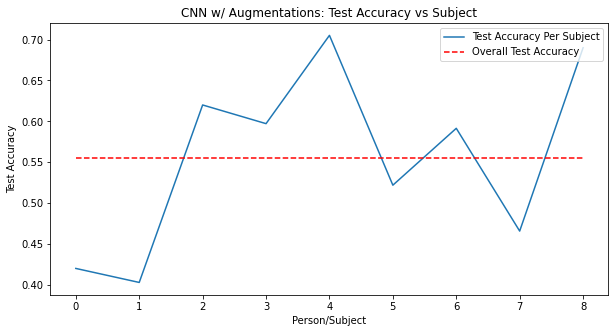

In [43]:
fig = plt.figure(figsize=(10,5))
plt.plot(np.arange(0,9), test_acc, label="Test Accuracy Per Subject")
plt.plot(np.arange(0,9), np.repeat(overall[0]['test_accuracy'], 9), 'r--', label="Overall Test Accuracy")
plt.legend(loc="upper right")
plt.xlabel("Person/Subject")
plt.ylabel("Test Accuracy")
plt.title("CNN w/ Augmentations: Test Accuracy vs Subject")
plt.show()

#TRAIN With CNN Augmentations on ONLY Subject 0 (Exp 1)!

In [46]:
torch.use_deterministic_algorithms(True, warn_only=True)

checkpoint_callback = ModelCheckpoint(
    save_top_k=3,
    monitor="val_loss",
    mode="min",
    dirpath=None,
    filename="best_val-{epoch:02d}-{val_loss:.2f}")

def train_aug_one_sub(model_name, model, seed):
  pl.seed_everything(seed, workers=True)
  g = torch.Generator()
  g.manual_seed(seed)
  train_dataloader, validation_dataloader, test_dataloader = prepare_dataset_augment(g)
  train_dataloader_0, validation_dataloader_0, test_dataloader_0 = prepare_dataset_augment(g, subjectIX=0, val_perc=0.05)
  logger = pl.loggers.TensorBoardLogger('official_logs', name=model_name)
  early_stopping_callback = EarlyStopping(monitor='val_loss', mode='min', patience=12)
  trainer = pl.Trainer(max_epochs=500, logger=logger, 
                       callbacks=[early_stopping_callback, checkpoint_callback],
                       accelerator="gpu", devices=1, deterministic=True, 
                       gradient_clip_val=2, accumulate_grad_batches=4) 
  trainer.fit(model, train_dataloaders=train_dataloader_0, val_dataloaders=validation_dataloader)
  return g, trainer, model, test_dataloader, test_dataloader_0

In [47]:
from models.CNN import *
model_name = "CNN w aug - one subject"
learning_rate = 1e-4
model = CNN(naive=True, end = False, lr=learning_rate)
g, trainer, model, test_dataloader, test_dataloader_0 = train_aug_one_sub(model_name, model, 40)

INFO:lightning_fabric.utilities.seed:Global seed set to 40
INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.utilities.rank_zero:IPU available: False, using: 0 IPUs
INFO:pytorch_lightning.utilities.rank_zero:HPU available: False, using: 0 HPUs
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
INFO:pytorch_lightning.callbacks.model_summary:
   | Name     | Type               | Params
-------------------------------------------------
0  | accuracy | MulticlassAccuracy | 0     
1  | conv1    | Conv1d             | 5.5 K 
2  | swish1   | ELU                | 0     
3  | maxpool1 | MaxPool1d          | 0     
4  | bn1      | BatchNorm1d        | 50    
5  | dropout1 | Dropout            | 0     
6  | conv2    | Conv1d             | 12.6 K
7  | swish2   | ELU                | 0     
8  | maxpool2 | MaxPool1d          | 0  

Sanity Checking: 0it [00:00, ?it/s]

Training: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Epoch 00011: reducing learning rate of group 0 to 7.5000e-05.


Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

## Test on only subject 0 data

In [48]:
trainer.test(model, dataloaders=test_dataloader_0, ckpt_path="best", verbose=True)

INFO:pytorch_lightning.utilities.rank_zero:Restoring states from the checkpoint path at official_logs/CNN w aug - one subject/version_1/checkpoints/best_val-epoch=01-val_loss=1.40.ckpt
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
INFO:pytorch_lightning.utilities.rank_zero:Loaded model weights from the checkpoint at official_logs/CNN w aug - one subject/version_1/checkpoints/best_val-epoch=01-val_loss=1.40.ckpt


Testing: 0it [00:00, ?it/s]

────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────
       Test metric             DataLoader 0
────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────
      test_accuracy         0.3628571331501007
        test_loss           1.3645000457763672
────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────


[{'test_loss': 1.3645000457763672, 'test_accuracy': 0.3628571331501007}]

## Test on subjects one at a time

In [49]:
test_acc = []
for subjectIX in range(0,9):
  _, _, test_dataloader_IX = prepare_dataset_augment(g, subjectIX=subjectIX)
  tested = trainer.test(model, dataloaders=test_dataloader_IX, ckpt_path="best", verbose=False)
  tested = tested[0]['test_accuracy']
  test_acc.append(tested)
  print("Subject " + str(subjectIX) + " Test Accuracy: " + str(tested))
  print()

INFO:pytorch_lightning.utilities.rank_zero:Restoring states from the checkpoint path at official_logs/CNN w aug - one subject/version_1/checkpoints/best_val-epoch=01-val_loss=1.40.ckpt
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
INFO:pytorch_lightning.utilities.rank_zero:Loaded model weights from the checkpoint at official_logs/CNN w aug - one subject/version_1/checkpoints/best_val-epoch=01-val_loss=1.40.ckpt


Testing: 0it [00:00, ?it/s]

Subject 0 Test Accuracy: 0.35428571701049805



INFO:pytorch_lightning.utilities.rank_zero:Restoring states from the checkpoint path at official_logs/CNN w aug - one subject/version_1/checkpoints/best_val-epoch=01-val_loss=1.40.ckpt
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
INFO:pytorch_lightning.utilities.rank_zero:Loaded model weights from the checkpoint at official_logs/CNN w aug - one subject/version_1/checkpoints/best_val-epoch=01-val_loss=1.40.ckpt


Testing: 0it [00:00, ?it/s]

Subject 1 Test Accuracy: 0.24571429193019867



INFO:pytorch_lightning.utilities.rank_zero:Restoring states from the checkpoint path at official_logs/CNN w aug - one subject/version_1/checkpoints/best_val-epoch=01-val_loss=1.40.ckpt
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
INFO:pytorch_lightning.utilities.rank_zero:Loaded model weights from the checkpoint at official_logs/CNN w aug - one subject/version_1/checkpoints/best_val-epoch=01-val_loss=1.40.ckpt


Testing: 0it [00:00, ?it/s]

Subject 2 Test Accuracy: 0.23714286088943481



INFO:pytorch_lightning.utilities.rank_zero:Restoring states from the checkpoint path at official_logs/CNN w aug - one subject/version_1/checkpoints/best_val-epoch=01-val_loss=1.40.ckpt
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
INFO:pytorch_lightning.utilities.rank_zero:Loaded model weights from the checkpoint at official_logs/CNN w aug - one subject/version_1/checkpoints/best_val-epoch=01-val_loss=1.40.ckpt


Testing: 0it [00:00, ?it/s]

Subject 3 Test Accuracy: 0.3514285683631897



INFO:pytorch_lightning.utilities.rank_zero:Restoring states from the checkpoint path at official_logs/CNN w aug - one subject/version_1/checkpoints/best_val-epoch=01-val_loss=1.40.ckpt
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
INFO:pytorch_lightning.utilities.rank_zero:Loaded model weights from the checkpoint at official_logs/CNN w aug - one subject/version_1/checkpoints/best_val-epoch=01-val_loss=1.40.ckpt


Testing: 0it [00:00, ?it/s]

Subject 4 Test Accuracy: 0.23404255509376526



INFO:pytorch_lightning.utilities.rank_zero:Restoring states from the checkpoint path at official_logs/CNN w aug - one subject/version_1/checkpoints/best_val-epoch=01-val_loss=1.40.ckpt
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
INFO:pytorch_lightning.utilities.rank_zero:Loaded model weights from the checkpoint at official_logs/CNN w aug - one subject/version_1/checkpoints/best_val-epoch=01-val_loss=1.40.ckpt


Testing: 0it [00:00, ?it/s]

Subject 5 Test Accuracy: 0.2448979616165161



INFO:pytorch_lightning.utilities.rank_zero:Restoring states from the checkpoint path at official_logs/CNN w aug - one subject/version_1/checkpoints/best_val-epoch=01-val_loss=1.40.ckpt
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
INFO:pytorch_lightning.utilities.rank_zero:Loaded model weights from the checkpoint at official_logs/CNN w aug - one subject/version_1/checkpoints/best_val-epoch=01-val_loss=1.40.ckpt


Testing: 0it [00:00, ?it/s]

Subject 6 Test Accuracy: 0.322857141494751



INFO:pytorch_lightning.utilities.rank_zero:Restoring states from the checkpoint path at official_logs/CNN w aug - one subject/version_1/checkpoints/best_val-epoch=01-val_loss=1.40.ckpt
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
INFO:pytorch_lightning.utilities.rank_zero:Loaded model weights from the checkpoint at official_logs/CNN w aug - one subject/version_1/checkpoints/best_val-epoch=01-val_loss=1.40.ckpt


Testing: 0it [00:00, ?it/s]

Subject 7 Test Accuracy: 0.3028571307659149



INFO:pytorch_lightning.utilities.rank_zero:Restoring states from the checkpoint path at official_logs/CNN w aug - one subject/version_1/checkpoints/best_val-epoch=01-val_loss=1.40.ckpt
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
INFO:pytorch_lightning.utilities.rank_zero:Loaded model weights from the checkpoint at official_logs/CNN w aug - one subject/version_1/checkpoints/best_val-epoch=01-val_loss=1.40.ckpt


Testing: 0it [00:00, ?it/s]

Subject 8 Test Accuracy: 0.34954407811164856



##Test on ALL subjects!

In [50]:
overall = trainer.test(model, dataloaders=test_dataloader, ckpt_path="best", verbose=True)

INFO:pytorch_lightning.utilities.rank_zero:Restoring states from the checkpoint path at official_logs/CNN w aug - one subject/version_1/checkpoints/best_val-epoch=01-val_loss=1.40.ckpt
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
INFO:pytorch_lightning.utilities.rank_zero:Loaded model weights from the checkpoint at official_logs/CNN w aug - one subject/version_1/checkpoints/best_val-epoch=01-val_loss=1.40.ckpt


Testing: 0it [00:00, ?it/s]

────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────
       Test metric             DataLoader 0
────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────
      test_accuracy         0.29732343554496765
        test_loss            1.390669345855713
────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────


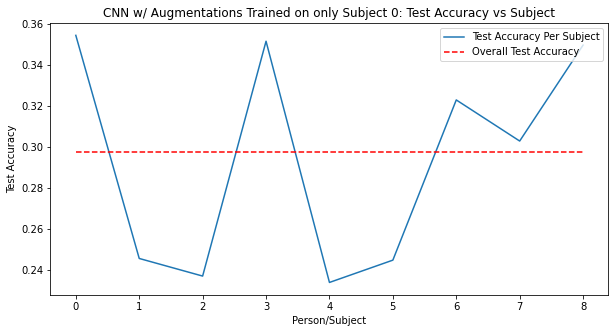

In [51]:
fig = plt.figure(figsize=(10,5))
plt.plot(np.arange(0,9), test_acc, label="Test Accuracy Per Subject")
plt.plot(np.arange(0,9), np.repeat(overall[0]['test_accuracy'], 9), 'r--', label="Overall Test Accuracy")
plt.legend(loc="upper right")
plt.xlabel("Person/Subject")
plt.ylabel("Test Accuracy")
plt.title("CNN w/ Augmentations Trained on only Subject 0: Test Accuracy vs Subject")
plt.show()

#TRAIN With CNN & LSTM Augmentations on ONLY Subject 0 (Exp 1)!

In [44]:
torch.use_deterministic_algorithms(True, warn_only=True)

checkpoint_callback = ModelCheckpoint(
    save_top_k=3,
    monitor="val_loss",
    mode="min",
    dirpath=None,
    filename="best_val-{epoch:02d}-{val_loss:.2f}")

def train_aug_one_sub(model_name, model, seed):
  pl.seed_everything(seed, workers=True)
  g = torch.Generator()
  g.manual_seed(seed)
  train_dataloader, validation_dataloader, test_dataloader = prepare_dataset_augment(g)
  train_dataloader_0, validation_dataloader_0, test_dataloader_0 = prepare_dataset_augment(g, subjectIX=0, val_perc=0.05)
  logger = pl.loggers.TensorBoardLogger('official_logs', name=model_name)
  early_stopping_callback = EarlyStopping(monitor='val_loss', mode='min', patience=12)
  trainer = pl.Trainer(max_epochs=500, logger=logger, 
                       callbacks=[early_stopping_callback, checkpoint_callback],
                       accelerator="gpu", devices=1, deterministic=True, 
                       gradient_clip_val=2, accumulate_grad_batches=4) 
  trainer.fit(model, train_dataloaders=train_dataloader_0, val_dataloaders=validation_dataloader)
  return g, trainer, model, test_dataloader, test_dataloader_0

In [45]:
from models.CNN import *
model_name = "CNN w aug w LSTM - one subject"
learning_rate = 1e-4
model = CNN_LSTM(naive=True, end = False, lr=learning_rate)
g, trainer, model, test_dataloader, test_dataloader_0 = train_aug_one_sub(model_name, model, 40)

INFO:lightning_fabric.utilities.seed:Global seed set to 40
INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.utilities.rank_zero:IPU available: False, using: 0 IPUs
INFO:pytorch_lightning.utilities.rank_zero:HPU available: False, using: 0 HPUs
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
INFO:pytorch_lightning.callbacks.model_summary:
   | Name     | Type               | Params
-------------------------------------------------
0  | accuracy | MulticlassAccuracy | 0     
1  | conv1    | Conv1d             | 6.1 K 
2  | swish1   | SiLU               | 0     
3  | maxpool1 | MaxPool1d          | 0     
4  | bn1      | BatchNorm1d        | 50    
5  | dropout1 | Dropout            | 0     
6  | conv2    | Conv1d             | 13.8 K
7  | swish2   | SiLU               | 0     
8  | maxpool2 | MaxPool1d          | 0  

Sanity Checking: 0it [00:00, ?it/s]

Training: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Epoch 00007: reducing learning rate of group 0 to 1.0000e-05.


Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Epoch 00013: reducing learning rate of group 0 to 1.0000e-06.


## Test on only subject 0 data

In [46]:
trainer.test(model, dataloaders=test_dataloader_0, ckpt_path="best", verbose=True)

INFO:pytorch_lightning.utilities.rank_zero:Restoring states from the checkpoint path at official_logs/CNN w aug w LSTM - one subject/version_0/checkpoints/best_val-epoch=00-val_loss=1.38.ckpt
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
INFO:pytorch_lightning.utilities.rank_zero:Loaded model weights from the checkpoint at official_logs/CNN w aug w LSTM - one subject/version_0/checkpoints/best_val-epoch=00-val_loss=1.38.ckpt


Testing: 0it [00:00, ?it/s]

────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────
       Test metric             DataLoader 0
────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────
      test_accuracy         0.2800000011920929
        test_loss           1.3848263025283813
────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────


[{'test_loss': 1.3848263025283813, 'test_accuracy': 0.2800000011920929}]

## Test on subjects one at a time

In [47]:
test_acc = []
for subjectIX in range(0,9):
  _, _, test_dataloader_IX = prepare_dataset_augment(g, subjectIX=subjectIX)
  tested = trainer.test(model, dataloaders=test_dataloader_IX, ckpt_path="best", verbose=False)
  tested = tested[0]['test_accuracy']
  test_acc.append(tested)
  print("Subject " + str(subjectIX) + " Test Accuracy: " + str(tested))
  print()

INFO:pytorch_lightning.utilities.rank_zero:Restoring states from the checkpoint path at official_logs/CNN w aug w LSTM - one subject/version_0/checkpoints/best_val-epoch=00-val_loss=1.38.ckpt
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
INFO:pytorch_lightning.utilities.rank_zero:Loaded model weights from the checkpoint at official_logs/CNN w aug w LSTM - one subject/version_0/checkpoints/best_val-epoch=00-val_loss=1.38.ckpt


Testing: 0it [00:00, ?it/s]

Subject 0 Test Accuracy: 0.2800000011920929



INFO:pytorch_lightning.utilities.rank_zero:Restoring states from the checkpoint path at official_logs/CNN w aug w LSTM - one subject/version_0/checkpoints/best_val-epoch=00-val_loss=1.38.ckpt
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
INFO:pytorch_lightning.utilities.rank_zero:Loaded model weights from the checkpoint at official_logs/CNN w aug w LSTM - one subject/version_0/checkpoints/best_val-epoch=00-val_loss=1.38.ckpt


Testing: 0it [00:00, ?it/s]

Subject 1 Test Accuracy: 0.20000000298023224



INFO:pytorch_lightning.utilities.rank_zero:Restoring states from the checkpoint path at official_logs/CNN w aug w LSTM - one subject/version_0/checkpoints/best_val-epoch=00-val_loss=1.38.ckpt
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
INFO:pytorch_lightning.utilities.rank_zero:Loaded model weights from the checkpoint at official_logs/CNN w aug w LSTM - one subject/version_0/checkpoints/best_val-epoch=00-val_loss=1.38.ckpt


Testing: 0it [00:00, ?it/s]

Subject 2 Test Accuracy: 0.18000000715255737



INFO:pytorch_lightning.utilities.rank_zero:Restoring states from the checkpoint path at official_logs/CNN w aug w LSTM - one subject/version_0/checkpoints/best_val-epoch=00-val_loss=1.38.ckpt
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
INFO:pytorch_lightning.utilities.rank_zero:Loaded model weights from the checkpoint at official_logs/CNN w aug w LSTM - one subject/version_0/checkpoints/best_val-epoch=00-val_loss=1.38.ckpt


Testing: 0it [00:00, ?it/s]

Subject 3 Test Accuracy: 0.2800000011920929



INFO:pytorch_lightning.utilities.rank_zero:Restoring states from the checkpoint path at official_logs/CNN w aug w LSTM - one subject/version_0/checkpoints/best_val-epoch=00-val_loss=1.38.ckpt
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
INFO:pytorch_lightning.utilities.rank_zero:Loaded model weights from the checkpoint at official_logs/CNN w aug w LSTM - one subject/version_0/checkpoints/best_val-epoch=00-val_loss=1.38.ckpt


Testing: 0it [00:00, ?it/s]

Subject 4 Test Accuracy: 0.1702127605676651



INFO:pytorch_lightning.utilities.rank_zero:Restoring states from the checkpoint path at official_logs/CNN w aug w LSTM - one subject/version_0/checkpoints/best_val-epoch=00-val_loss=1.38.ckpt
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
INFO:pytorch_lightning.utilities.rank_zero:Loaded model weights from the checkpoint at official_logs/CNN w aug w LSTM - one subject/version_0/checkpoints/best_val-epoch=00-val_loss=1.38.ckpt


Testing: 0it [00:00, ?it/s]

Subject 5 Test Accuracy: 0.20408163964748383



INFO:pytorch_lightning.utilities.rank_zero:Restoring states from the checkpoint path at official_logs/CNN w aug w LSTM - one subject/version_0/checkpoints/best_val-epoch=00-val_loss=1.38.ckpt
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
INFO:pytorch_lightning.utilities.rank_zero:Loaded model weights from the checkpoint at official_logs/CNN w aug w LSTM - one subject/version_0/checkpoints/best_val-epoch=00-val_loss=1.38.ckpt


Testing: 0it [00:00, ?it/s]

Subject 6 Test Accuracy: 0.1599999964237213



INFO:pytorch_lightning.utilities.rank_zero:Restoring states from the checkpoint path at official_logs/CNN w aug w LSTM - one subject/version_0/checkpoints/best_val-epoch=00-val_loss=1.38.ckpt
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
INFO:pytorch_lightning.utilities.rank_zero:Loaded model weights from the checkpoint at official_logs/CNN w aug w LSTM - one subject/version_0/checkpoints/best_val-epoch=00-val_loss=1.38.ckpt


Testing: 0it [00:00, ?it/s]

Subject 7 Test Accuracy: 0.2199999988079071



INFO:pytorch_lightning.utilities.rank_zero:Restoring states from the checkpoint path at official_logs/CNN w aug w LSTM - one subject/version_0/checkpoints/best_val-epoch=00-val_loss=1.38.ckpt
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
INFO:pytorch_lightning.utilities.rank_zero:Loaded model weights from the checkpoint at official_logs/CNN w aug w LSTM - one subject/version_0/checkpoints/best_val-epoch=00-val_loss=1.38.ckpt


Testing: 0it [00:00, ?it/s]

Subject 8 Test Accuracy: 0.25531917810440063



##Test on ALL subjects!

In [48]:
overall = trainer.test(model, dataloaders=test_dataloader, ckpt_path="best", verbose=True)

INFO:pytorch_lightning.utilities.rank_zero:Restoring states from the checkpoint path at official_logs/CNN w aug w LSTM - one subject/version_0/checkpoints/best_val-epoch=00-val_loss=1.38.ckpt
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
INFO:pytorch_lightning.utilities.rank_zero:Loaded model weights from the checkpoint at official_logs/CNN w aug w LSTM - one subject/version_0/checkpoints/best_val-epoch=00-val_loss=1.38.ckpt


Testing: 0it [00:00, ?it/s]

────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────
       Test metric             DataLoader 0
────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────
      test_accuracy         0.21670429408550262
        test_loss           1.3919451236724854
────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────


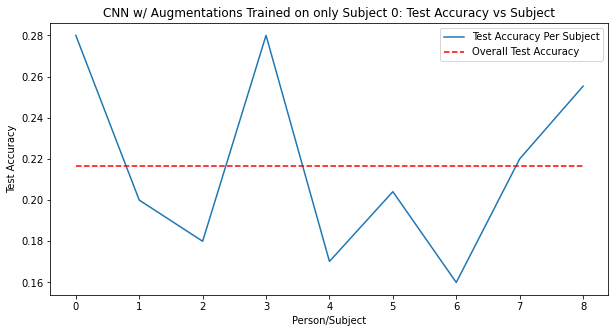

In [49]:
fig = plt.figure(figsize=(10,5))
plt.plot(np.arange(0,9), test_acc, label="Test Accuracy Per Subject")
plt.plot(np.arange(0,9), np.repeat(overall[0]['test_accuracy'], 9), 'r--', label="Overall Test Accuracy")
plt.legend(loc="upper right")
plt.xlabel("Person/Subject")
plt.ylabel("Test Accuracy")
plt.title("CNN w/ Augmentations Trained on only Subject 0: Test Accuracy vs Subject")
plt.show()

#TRAIN With CNN & MHA Augmentations on ONLY Subject 0 (Exp 1)!

In [50]:
torch.use_deterministic_algorithms(True, warn_only=True)

checkpoint_callback = ModelCheckpoint(
    save_top_k=3,
    monitor="val_loss",
    mode="min",
    dirpath=None,
    filename="best_val-{epoch:02d}-{val_loss:.2f}")

def train_aug_one_sub(model_name, model, seed):
  pl.seed_everything(seed, workers=True)
  g = torch.Generator()
  g.manual_seed(seed)
  train_dataloader, validation_dataloader, test_dataloader = prepare_dataset_augment(g)
  train_dataloader_0, validation_dataloader_0, test_dataloader_0 = prepare_dataset_augment(g, subjectIX=0, val_perc=0.05)
  logger = pl.loggers.TensorBoardLogger('official_logs', name=model_name)
  early_stopping_callback = EarlyStopping(monitor='val_loss', mode='min', patience=12)
  trainer = pl.Trainer(max_epochs=500, logger=logger, 
                       callbacks=[early_stopping_callback, checkpoint_callback],
                       accelerator="gpu", devices=1, deterministic=True, 
                       gradient_clip_val=2, accumulate_grad_batches=4) 
  trainer.fit(model, train_dataloaders=train_dataloader_0, val_dataloaders=validation_dataloader)
  return g, trainer, model, test_dataloader, test_dataloader_0

In [51]:
from models.CNN import *
model_name = "CNN w aug w MHA - one subject"
learning_rate = 1e-4
model = CNN_MHA(naive=True, end = False, lr=learning_rate)
g, trainer, model, test_dataloader, test_dataloader_0 = train_aug_one_sub(model_name, model, 40)

INFO:lightning_fabric.utilities.seed:Global seed set to 40
INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.utilities.rank_zero:IPU available: False, using: 0 IPUs
INFO:pytorch_lightning.utilities.rank_zero:HPU available: False, using: 0 HPUs
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
INFO:pytorch_lightning.callbacks.model_summary:
   | Name     | Type               | Params
-------------------------------------------------
0  | accuracy | MulticlassAccuracy | 0     
1  | conv1    | Conv1d             | 6.1 K 
2  | swish1   | SiLU               | 0     
3  | maxpool1 | MaxPool1d          | 0     
4  | bn1      | BatchNorm1d        | 50    
5  | dropout1 | Dropout            | 0     
6  | conv2    | Conv1d             | 13.8 K
7  | swish2   | SiLU               | 0     
8  | maxpool2 | MaxPool1d          | 0  

Sanity Checking: 0it [00:00, ?it/s]

Training: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Epoch 00048: reducing learning rate of group 0 to 1.0000e-05.


Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Epoch 00060: reducing learning rate of group 0 to 1.0000e-06.


Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Epoch 00066: reducing learning rate of group 0 to 1.0000e-07.


## Test on only subject 0 data

In [52]:
trainer.test(model, dataloaders=test_dataloader_0, ckpt_path="best", verbose=True)

INFO:pytorch_lightning.utilities.rank_zero:Restoring states from the checkpoint path at official_logs/CNN w aug w MHA - one subject/version_0/checkpoints/best_val-epoch=53-val_loss=1.36.ckpt
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
INFO:pytorch_lightning.utilities.rank_zero:Loaded model weights from the checkpoint at official_logs/CNN w aug w MHA - one subject/version_0/checkpoints/best_val-epoch=53-val_loss=1.36.ckpt


Testing: 0it [00:00, ?it/s]

────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────
       Test metric             DataLoader 0
────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────
      test_accuracy         0.24285714328289032
        test_loss           1.3766589164733887
────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────


[{'test_loss': 1.3766589164733887, 'test_accuracy': 0.24285714328289032}]

## Test on subjects one at a time

In [53]:
test_acc = []
for subjectIX in range(0,9):
  _, _, test_dataloader_IX = prepare_dataset_augment(g, subjectIX=subjectIX)
  tested = trainer.test(model, dataloaders=test_dataloader_IX, ckpt_path="best", verbose=False)
  tested = tested[0]['test_accuracy']
  test_acc.append(tested)
  print("Subject " + str(subjectIX) + " Test Accuracy: " + str(tested))
  print()

INFO:pytorch_lightning.utilities.rank_zero:Restoring states from the checkpoint path at official_logs/CNN w aug w MHA - one subject/version_0/checkpoints/best_val-epoch=53-val_loss=1.36.ckpt
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
INFO:pytorch_lightning.utilities.rank_zero:Loaded model weights from the checkpoint at official_logs/CNN w aug w MHA - one subject/version_0/checkpoints/best_val-epoch=53-val_loss=1.36.ckpt


Testing: 0it [00:00, ?it/s]

Subject 0 Test Accuracy: 0.24285714328289032



INFO:pytorch_lightning.utilities.rank_zero:Restoring states from the checkpoint path at official_logs/CNN w aug w MHA - one subject/version_0/checkpoints/best_val-epoch=53-val_loss=1.36.ckpt
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
INFO:pytorch_lightning.utilities.rank_zero:Loaded model weights from the checkpoint at official_logs/CNN w aug w MHA - one subject/version_0/checkpoints/best_val-epoch=53-val_loss=1.36.ckpt


Testing: 0it [00:00, ?it/s]

Subject 1 Test Accuracy: 0.2914285659790039



INFO:pytorch_lightning.utilities.rank_zero:Restoring states from the checkpoint path at official_logs/CNN w aug w MHA - one subject/version_0/checkpoints/best_val-epoch=53-val_loss=1.36.ckpt
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
INFO:pytorch_lightning.utilities.rank_zero:Loaded model weights from the checkpoint at official_logs/CNN w aug w MHA - one subject/version_0/checkpoints/best_val-epoch=53-val_loss=1.36.ckpt


Testing: 0it [00:00, ?it/s]

Subject 2 Test Accuracy: 0.345714271068573



INFO:pytorch_lightning.utilities.rank_zero:Restoring states from the checkpoint path at official_logs/CNN w aug w MHA - one subject/version_0/checkpoints/best_val-epoch=53-val_loss=1.36.ckpt
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
INFO:pytorch_lightning.utilities.rank_zero:Loaded model weights from the checkpoint at official_logs/CNN w aug w MHA - one subject/version_0/checkpoints/best_val-epoch=53-val_loss=1.36.ckpt


Testing: 0it [00:00, ?it/s]

Subject 3 Test Accuracy: 0.3400000035762787



INFO:pytorch_lightning.utilities.rank_zero:Restoring states from the checkpoint path at official_logs/CNN w aug w MHA - one subject/version_0/checkpoints/best_val-epoch=53-val_loss=1.36.ckpt
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
INFO:pytorch_lightning.utilities.rank_zero:Loaded model weights from the checkpoint at official_logs/CNN w aug w MHA - one subject/version_0/checkpoints/best_val-epoch=53-val_loss=1.36.ckpt


Testing: 0it [00:00, ?it/s]

Subject 4 Test Accuracy: 0.24316109716892242



INFO:pytorch_lightning.utilities.rank_zero:Restoring states from the checkpoint path at official_logs/CNN w aug w MHA - one subject/version_0/checkpoints/best_val-epoch=53-val_loss=1.36.ckpt
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
INFO:pytorch_lightning.utilities.rank_zero:Loaded model weights from the checkpoint at official_logs/CNN w aug w MHA - one subject/version_0/checkpoints/best_val-epoch=53-val_loss=1.36.ckpt


Testing: 0it [00:00, ?it/s]

Subject 5 Test Accuracy: 0.34110787510871887



INFO:pytorch_lightning.utilities.rank_zero:Restoring states from the checkpoint path at official_logs/CNN w aug w MHA - one subject/version_0/checkpoints/best_val-epoch=53-val_loss=1.36.ckpt
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
INFO:pytorch_lightning.utilities.rank_zero:Loaded model weights from the checkpoint at official_logs/CNN w aug w MHA - one subject/version_0/checkpoints/best_val-epoch=53-val_loss=1.36.ckpt


Testing: 0it [00:00, ?it/s]

Subject 6 Test Accuracy: 0.3285714387893677



INFO:pytorch_lightning.utilities.rank_zero:Restoring states from the checkpoint path at official_logs/CNN w aug w MHA - one subject/version_0/checkpoints/best_val-epoch=53-val_loss=1.36.ckpt
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
INFO:pytorch_lightning.utilities.rank_zero:Loaded model weights from the checkpoint at official_logs/CNN w aug w MHA - one subject/version_0/checkpoints/best_val-epoch=53-val_loss=1.36.ckpt


Testing: 0it [00:00, ?it/s]

Subject 7 Test Accuracy: 0.43142858147621155



INFO:pytorch_lightning.utilities.rank_zero:Restoring states from the checkpoint path at official_logs/CNN w aug w MHA - one subject/version_0/checkpoints/best_val-epoch=53-val_loss=1.36.ckpt
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
INFO:pytorch_lightning.utilities.rank_zero:Loaded model weights from the checkpoint at official_logs/CNN w aug w MHA - one subject/version_0/checkpoints/best_val-epoch=53-val_loss=1.36.ckpt


Testing: 0it [00:00, ?it/s]

Subject 8 Test Accuracy: 0.4164133667945862



##Test on ALL subjects!

In [54]:
overall = trainer.test(model, dataloaders=test_dataloader, ckpt_path="best", verbose=True)

INFO:pytorch_lightning.utilities.rank_zero:Restoring states from the checkpoint path at official_logs/CNN w aug w MHA - one subject/version_0/checkpoints/best_val-epoch=53-val_loss=1.36.ckpt
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
INFO:pytorch_lightning.utilities.rank_zero:Loaded model weights from the checkpoint at official_logs/CNN w aug w MHA - one subject/version_0/checkpoints/best_val-epoch=53-val_loss=1.36.ckpt


Testing: 0it [00:00, ?it/s]

────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────
       Test metric             DataLoader 0
────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────
      test_accuracy         0.3298935890197754
        test_loss           1.3604986667633057
────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────


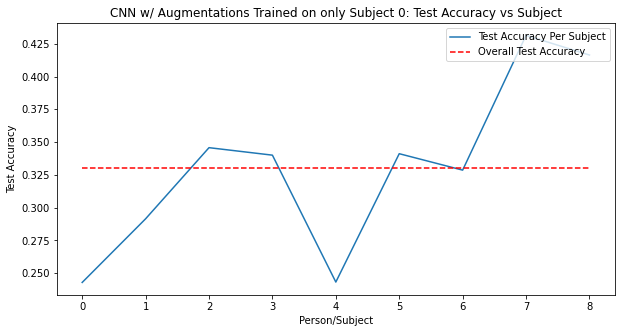

In [55]:
fig = plt.figure(figsize=(10,5))
plt.plot(np.arange(0,9), test_acc, label="Test Accuracy Per Subject")
plt.plot(np.arange(0,9), np.repeat(overall[0]['test_accuracy'], 9), 'r--', label="Overall Test Accuracy")
plt.legend(loc="upper right")
plt.xlabel("Person/Subject")
plt.ylabel("Test Accuracy")
plt.title("CNN w/ Augmentations Trained on only Subject 0: Test Accuracy vs Subject")
plt.show()

#TRAIN With Augmentations over Varying Time Periods!

In [29]:
torch.use_deterministic_algorithms(True, warn_only=True)

checkpoint_callback = ModelCheckpoint(
    save_top_k=3,
    monitor="val_loss",
    mode="min",
    dirpath=None,
    filename="best_val-{epoch:02d}-{val_loss:.2f}")

def train_aug(model_name, model, seed, time_window):
  pl.seed_everything(seed, workers=True)
  g = torch.Generator()
  g.manual_seed(seed)
  train_dataloader, validation_dataloader, test_dataloader = prepare_dataset_augment(g, time_window=time_window)
  logger = pl.loggers.TensorBoardLogger('official_logs', name=model_name)
  early_stopping_callback = EarlyStopping(monitor='val_loss', mode='min', patience=12)
  trainer = pl.Trainer(max_epochs=1000, logger=logger, 
                       callbacks=[early_stopping_callback, checkpoint_callback],
                       accelerator="gpu", devices=1, deterministic=True, 
                       gradient_clip_val=2, accumulate_grad_batches=4) 
  trainer.fit(model, train_dataloaders=train_dataloader, val_dataloaders=validation_dataloader)
  return g, trainer, model, test_dataloader

In [31]:
from models.CNN import *
model_name = "CNN w aug - time_window "
learning_rate = 3e-4
time_windows = [32,64,96,128,160,192,224,256,384,512]
test_acc = []
for windowIX in time_windows:
  model = CNN(naive=True, end = False, lr=learning_rate, time_window=windowIX)
  g, trainer, model, test_dataloader = train_aug(model_name+str(windowIX), model, 40, time_window=windowIX*2)
  overall = trainer.test(model, dataloaders=test_dataloader, verbose=False)
  test_acc.append(overall[0]['test_accuracy'])
  print("Test Accuracy for Time Window " + str(windowIX) + ": " + str(overall[0]['test_accuracy']))

INFO:lightning_fabric.utilities.seed:Global seed set to 40
INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.utilities.rank_zero:IPU available: False, using: 0 IPUs
INFO:pytorch_lightning.utilities.rank_zero:HPU available: False, using: 0 HPUs
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
INFO:pytorch_lightning.callbacks.model_summary:
   | Name     | Type               | Params
-------------------------------------------------
0  | accuracy | MulticlassAccuracy | 0     
1  | conv1    | Conv1d             | 5.5 K 
2  | swish1   | ELU                | 0     
3  | maxpool1 | MaxPool1d          | 0     
4  | bn1      | BatchNorm1d        | 50    
5  | dropout1 | Dropout            | 0     
6  | conv2    | Conv1d             | 12.6 K
7  | swish2   | ELU                | 0     
8  | maxpool2 | MaxPool1d          | 0  

Sanity Checking: 0it [00:00, ?it/s]

Training: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Epoch 00010: reducing learning rate of group 0 to 2.2500e-04.


Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Testing: 0it [00:00, ?it/s]

INFO:lightning_fabric.utilities.seed:Global seed set to 40


Test Accuracy for Time Window 32: 0.31312480568885803


INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.utilities.rank_zero:IPU available: False, using: 0 IPUs
INFO:pytorch_lightning.utilities.rank_zero:HPU available: False, using: 0 HPUs
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
INFO:pytorch_lightning.callbacks.model_summary:
   | Name     | Type               | Params
-------------------------------------------------
0  | accuracy | MulticlassAccuracy | 0     
1  | conv1    | Conv1d             | 5.5 K 
2  | swish1   | ELU                | 0     
3  | maxpool1 | MaxPool1d          | 0     
4  | bn1      | BatchNorm1d        | 50    
5  | dropout1 | Dropout            | 0     
6  | conv2    | Conv1d             | 12.6 K
7  | swish2   | ELU                | 0     
8  | maxpool2 | MaxPool1d          | 0     
9  | bn2      | BatchNorm1d        | 100   
10 | dropou

Sanity Checking: 0it [00:00, ?it/s]

Training: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Epoch 00020: reducing learning rate of group 0 to 2.2500e-04.


Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Testing: 0it [00:00, ?it/s]

INFO:lightning_fabric.utilities.seed:Global seed set to 40


Test Accuracy for Time Window 64: 0.34214770793914795


INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.utilities.rank_zero:IPU available: False, using: 0 IPUs
INFO:pytorch_lightning.utilities.rank_zero:HPU available: False, using: 0 HPUs
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
INFO:pytorch_lightning.callbacks.model_summary:
   | Name     | Type               | Params
-------------------------------------------------
0  | accuracy | MulticlassAccuracy | 0     
1  | conv1    | Conv1d             | 5.5 K 
2  | swish1   | ELU                | 0     
3  | maxpool1 | MaxPool1d          | 0     
4  | bn1      | BatchNorm1d        | 50    
5  | dropout1 | Dropout            | 0     
6  | conv2    | Conv1d             | 12.6 K
7  | swish2   | ELU                | 0     
8  | maxpool2 | MaxPool1d          | 0     
9  | bn2      | BatchNorm1d        | 100   
10 | dropou

Sanity Checking: 0it [00:00, ?it/s]

Training: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Epoch 00014: reducing learning rate of group 0 to 2.2500e-04.


Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Testing: 0it [00:00, ?it/s]

INFO:lightning_fabric.utilities.seed:Global seed set to 40


Test Accuracy for Time Window 96: 0.2918413281440735


INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.utilities.rank_zero:IPU available: False, using: 0 IPUs
INFO:pytorch_lightning.utilities.rank_zero:HPU available: False, using: 0 HPUs
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
INFO:pytorch_lightning.callbacks.model_summary:
   | Name     | Type               | Params
-------------------------------------------------
0  | accuracy | MulticlassAccuracy | 0     
1  | conv1    | Conv1d             | 5.5 K 
2  | swish1   | ELU                | 0     
3  | maxpool1 | MaxPool1d          | 0     
4  | bn1      | BatchNorm1d        | 50    
5  | dropout1 | Dropout            | 0     
6  | conv2    | Conv1d             | 12.6 K
7  | swish2   | ELU                | 0     
8  | maxpool2 | MaxPool1d          | 0     
9  | bn2      | BatchNorm1d        | 100   
10 | dropou

Sanity Checking: 0it [00:00, ?it/s]

Training: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Epoch 00013: reducing learning rate of group 0 to 2.2500e-04.


Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Testing: 0it [00:00, ?it/s]

INFO:lightning_fabric.utilities.seed:Global seed set to 40


Test Accuracy for Time Window 128: 0.30796515941619873


INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.utilities.rank_zero:IPU available: False, using: 0 IPUs
INFO:pytorch_lightning.utilities.rank_zero:HPU available: False, using: 0 HPUs
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
INFO:pytorch_lightning.callbacks.model_summary:
   | Name     | Type               | Params
-------------------------------------------------
0  | accuracy | MulticlassAccuracy | 0     
1  | conv1    | Conv1d             | 5.5 K 
2  | swish1   | ELU                | 0     
3  | maxpool1 | MaxPool1d          | 0     
4  | bn1      | BatchNorm1d        | 50    
5  | dropout1 | Dropout            | 0     
6  | conv2    | Conv1d             | 12.6 K
7  | swish2   | ELU                | 0     
8  | maxpool2 | MaxPool1d          | 0     
9  | bn2      | BatchNorm1d        | 100   
10 | dropou

Sanity Checking: 0it [00:00, ?it/s]

Training: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Epoch 00168: reducing learning rate of group 0 to 2.2500e-04.


Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Epoch 00256: reducing learning rate of group 0 to 1.6875e-04.


Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Testing: 0it [00:00, ?it/s]

INFO:lightning_fabric.utilities.seed:Global seed set to 40


Test Accuracy for Time Window 160: 0.6433408856391907


INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.utilities.rank_zero:IPU available: False, using: 0 IPUs
INFO:pytorch_lightning.utilities.rank_zero:HPU available: False, using: 0 HPUs
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
INFO:pytorch_lightning.callbacks.model_summary:
   | Name     | Type               | Params
-------------------------------------------------
0  | accuracy | MulticlassAccuracy | 0     
1  | conv1    | Conv1d             | 5.5 K 
2  | swish1   | ELU                | 0     
3  | maxpool1 | MaxPool1d          | 0     
4  | bn1      | BatchNorm1d        | 50    
5  | dropout1 | Dropout            | 0     
6  | conv2    | Conv1d             | 12.6 K
7  | swish2   | ELU                | 0     
8  | maxpool2 | MaxPool1d          | 0     
9  | bn2      | BatchNorm1d        | 100   
10 | dropou

Sanity Checking: 0it [00:00, ?it/s]

Training: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Epoch 00037: reducing learning rate of group 0 to 2.2500e-04.


Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Epoch 00300: reducing learning rate of group 0 to 1.6875e-04.


Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Epoch 00335: reducing learning rate of group 0 to 1.2656e-04.


Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Testing: 0it [00:00, ?it/s]

INFO:lightning_fabric.utilities.seed:Global seed set to 40


Test Accuracy for Time Window 192: 0.6584972739219666


INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.utilities.rank_zero:IPU available: False, using: 0 IPUs
INFO:pytorch_lightning.utilities.rank_zero:HPU available: False, using: 0 HPUs
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
INFO:pytorch_lightning.callbacks.model_summary:
   | Name     | Type               | Params
-------------------------------------------------
0  | accuracy | MulticlassAccuracy | 0     
1  | conv1    | Conv1d             | 5.5 K 
2  | swish1   | ELU                | 0     
3  | maxpool1 | MaxPool1d          | 0     
4  | bn1      | BatchNorm1d        | 50    
5  | dropout1 | Dropout            | 0     
6  | conv2    | Conv1d             | 12.6 K
7  | swish2   | ELU                | 0     
8  | maxpool2 | MaxPool1d          | 0     
9  | bn2      | BatchNorm1d        | 100   
10 | dropou

Sanity Checking: 0it [00:00, ?it/s]

Training: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Epoch 00038: reducing learning rate of group 0 to 2.2500e-04.


Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Epoch 00288: reducing learning rate of group 0 to 1.6875e-04.


Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Testing: 0it [00:00, ?it/s]

INFO:lightning_fabric.utilities.seed:Global seed set to 40


Test Accuracy for Time Window 224: 0.6581747531890869


INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.utilities.rank_zero:IPU available: False, using: 0 IPUs
INFO:pytorch_lightning.utilities.rank_zero:HPU available: False, using: 0 HPUs
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
INFO:pytorch_lightning.callbacks.model_summary:
   | Name     | Type               | Params
-------------------------------------------------
0  | accuracy | MulticlassAccuracy | 0     
1  | conv1    | Conv1d             | 5.5 K 
2  | swish1   | ELU                | 0     
3  | maxpool1 | MaxPool1d          | 0     
4  | bn1      | BatchNorm1d        | 50    
5  | dropout1 | Dropout            | 0     
6  | conv2    | Conv1d             | 12.6 K
7  | swish2   | ELU                | 0     
8  | maxpool2 | MaxPool1d          | 0     
9  | bn2      | BatchNorm1d        | 100   
10 | dropou

Sanity Checking: 0it [00:00, ?it/s]

Training: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Epoch 00026: reducing learning rate of group 0 to 2.2500e-04.


Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Epoch 00039: reducing learning rate of group 0 to 1.6875e-04.


Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Epoch 00236: reducing learning rate of group 0 to 1.2656e-04.


Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Epoch 00257: reducing learning rate of group 0 to 9.4922e-05.


Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Epoch 00279: reducing learning rate of group 0 to 7.1191e-05.


Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Epoch 00311: reducing learning rate of group 0 to 5.3394e-05.


Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Testing: 0it [00:00, ?it/s]

INFO:lightning_fabric.utilities.seed:Global seed set to 40


Test Accuracy for Time Window 256: 0.6446307897567749


INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.utilities.rank_zero:IPU available: False, using: 0 IPUs
INFO:pytorch_lightning.utilities.rank_zero:HPU available: False, using: 0 HPUs
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
INFO:pytorch_lightning.callbacks.model_summary:
   | Name     | Type               | Params
-------------------------------------------------
0  | accuracy | MulticlassAccuracy | 0     
1  | conv1    | Conv1d             | 5.5 K 
2  | swish1   | ELU                | 0     
3  | maxpool1 | MaxPool1d          | 0     
4  | bn1      | BatchNorm1d        | 50    
5  | dropout1 | Dropout            | 0     
6  | conv2    | Conv1d             | 12.6 K
7  | swish2   | ELU                | 0     
8  | maxpool2 | MaxPool1d          | 0     
9  | bn2      | BatchNorm1d        | 100   
10 | dropou

Sanity Checking: 0it [00:00, ?it/s]

Training: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Epoch 00235: reducing learning rate of group 0 to 2.2500e-04.


Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Testing: 0it [00:00, ?it/s]

INFO:lightning_fabric.utilities.seed:Global seed set to 40


Test Accuracy for Time Window 384: 0.6852627992630005


INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.utilities.rank_zero:IPU available: False, using: 0 IPUs
INFO:pytorch_lightning.utilities.rank_zero:HPU available: False, using: 0 HPUs
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
INFO:pytorch_lightning.callbacks.model_summary:
   | Name     | Type               | Params
-------------------------------------------------
0  | accuracy | MulticlassAccuracy | 0     
1  | conv1    | Conv1d             | 5.5 K 
2  | swish1   | ELU                | 0     
3  | maxpool1 | MaxPool1d          | 0     
4  | bn1      | BatchNorm1d        | 50    
5  | dropout1 | Dropout            | 0     
6  | conv2    | Conv1d             | 12.6 K
7  | swish2   | ELU                | 0     
8  | maxpool2 | MaxPool1d          | 0     
9  | bn2      | BatchNorm1d        | 100   
10 | dropou

Sanity Checking: 0it [00:00, ?it/s]

Training: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Epoch 00017: reducing learning rate of group 0 to 2.2500e-04.


Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Testing: 0it [00:00, ?it/s]

Test Accuracy for Time Window 512: 0.3344082534313202


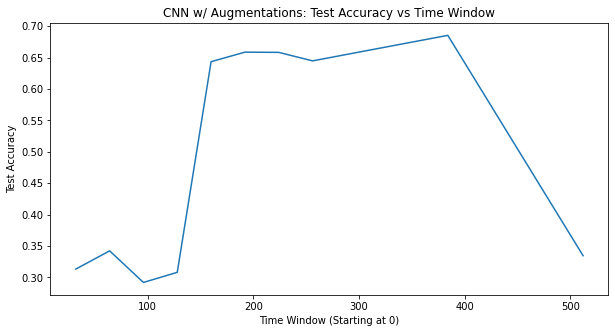

In [37]:
fig = plt.figure(figsize=(10,5))
plt.plot(time_windows, test_acc)
plt.xlabel("Time Window (Starting at 0)")
plt.ylabel("Test Accuracy")
plt.title("CNN w/ Augmentations: Test Accuracy vs Time Window")
plt.show()

# Tensorboard!!!

In [ ]:
%load_ext tensorboard
%tensorboard --logdir official_logs/